In [ ]:
!pip install -U -q PyDrive
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials
# Authenticate and create the PyDrive client.
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
import sys
import numpy as np
import pandas as pd
from matplotlib.pyplot import imread
import pickle
from os import listdir
import matplotlib.pyplot as plt
%matplotlib inline

import cv2
import time

import tensorflow as tf
from keras.models import Sequential
from keras.optimizers import Adam
from keras.layers import Conv2D, ZeroPadding2D, Activation, Input, concatenate
from keras.models import Model

from keras.layers.normalization import BatchNormalization
from keras.layers.pooling import MaxPooling2D
from keras.layers.merge import Concatenate
from keras.layers.core import Lambda, Flatten, Dense
from keras.initializers import glorot_uniform

from keras.engine.topology import Layer
from keras.regularizers import l2
from keras import backend as K

from sklearn.utils import shuffle

import numpy.random as rng

In [3]:
import re
import numpy as np
from PIL import Image

from sklearn.model_selection import train_test_split
from keras import backend as K
from keras.layers import Activation
from keras.layers import Input, Lambda, Dense, Dropout, Convolution2D, MaxPooling2D, Flatten
from keras.models import Sequential, Model
from keras.optimizers import RMSprop

In [4]:

from keras.preprocessing.image import load_img
from keras.preprocessing.image import img_to_array

from keras.models import Model

##List Images loading

In [ ]:
file1=open('/content/drive/My Drive/IR/Flickr15K/list_images.txt','rb')
imageName=[]
arr=file1.readlines()
str(arr[0]).split(' ')[1].split('\\n')
for i in range(len(arr)):
  imageName.append(str(arr[i]).split(' ')[1].split('\\n')[0])

In [ ]:
imageName

['fire_balloon/110181.jpg',
 'fire_balloon/129097.jpg',
 'fire_balloon/13794.jpg',
 'fire_balloon/138163.jpg',
 'fire_balloon/142476.jpg',
 'fire_balloon/142850.jpg',
 'fire_balloon/142984.jpg',
 'fire_balloon/143028.jpg',
 'fire_balloon/356485.jpg',
 'fire_balloon/356488.jpg',
 'fire_balloon/356491.jpg',
 'fire_balloon/356498.jpg',
 'fire_balloon/356557.jpg',
 'fire_balloon/366639.jpg',
 'fire_balloon/384541.jpg',
 'fire_balloon/390060.jpg',
 'fire_balloon/551831.jpg',
 'fire_balloon/551835.jpg',
 'fire_balloon/566962.jpg',
 'fire_balloon/60385.jpg',
 'fire_balloon/60388.jpg',
 'fire_balloon/73852.jpg',
 'fire_balloon/73863.jpg',
 'fire_balloon/81386.jpg',
 'fire_balloon/81393.jpg',
 'fire_balloon/90415.jpg',
 'fire_balloon/917248.jpg',
 'fire_balloon/917249.jpg',
 'fire_balloon/917254.jpg',
 'fire_balloon/947521.jpg',
 'fire_balloon/96346.jpg',
 'fire_balloon/96384.jpg',
 'fire_balloon/96539.jpg',
 'fire_balloon/97479.jpg',
 'fire_balloon/99016.jpg',
 'fire_balloon/990953.jpg',
 'Lon

In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib

get_ipython().magic(u'matplotlib inline')
matplotlib.rcParams["savefig.dpi"] = 400 # to get high resolution

##Sample canny edge detection 

(Text(0.5, 1.0, 'Edge Image'),
 ([], <a list of 0 Text major ticklabel objects>),
 ([], <a list of 0 Text major ticklabel objects>))

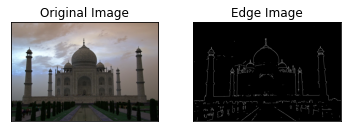

In [ ]:
img = cv2.imread('/content/drive/My Drive/IR/Flickr15K/images/Taj_Mahal/1024263.jpg')
# img=cv2.resize(img,(224,224))
edges = cv2.Canny(img,150,200)
# edges=cv2.resize(edges,(224,224))
edges = cv2.cvtColor(edges,cv2.COLOR_GRAY2RGB)
# Plotting
plt.subplot(221),plt.imshow(img,cmap = 'gray')
plt.title('Original Image'), plt.xticks([]), plt.yticks([])
plt.subplot(222),plt.imshow(edges,cmap = 'gray')
plt.title('Edge Image'), plt.xticks([]), plt.yticks([])

## Feature extraction using Resnet

ResNet50 Feature extraction

In [ ]:
from os import listdir
from keras.layers import Conv2D, MaxPool2D, Flatten, Dense, Input, Subtract, Lambda
from pickle import dump
from keras.applications.resnet50 import ResNet50
from keras.preprocessing.image import load_img
from keras.preprocessing.image import img_to_array
from keras.applications.resnet50 import preprocess_input
from keras.models import Model
import numpy as np

def extract_features(directory):
  model = ResNet50()
	# re-structure the model
  model = Model(inputs=model.inputs, outputs=model.layers[-3].output)
  # print(model.layers[-1].output)
  print(model.summary())
  features=dict()
  count=0
  res=[]
  
  for name in imageName:
    # load an image from file
    count+=1
    filename = directory + '/' + name
    image = cv2.imread(filename)
    
    image = cv2.Canny(image,150,200)
    # convert the image pixels to a numpy array
    image = cv2.resize(image, (224,224))
    image = cv2.cvtColor(image,cv2.COLOR_GRAY2RGB)
    image = np.array(image)

    # print(np.shape(image))
    # reshape data for the model
    
    # print("Hello: ",image.shape[2])
    # prepare the image for the VGG model
    image = image.reshape((1,image.shape[0], image.shape[1], image.shape[2]))
    image = preprocess_input(image)
    # get features
    feature = model.predict(image, verbose=0)
    # get image id
    # print(np.shape(feature))
    image_id = name.split('.')[0]
    # store feature
    features[image_id] = feature
    # print(feature)
    if count%100==0:
      print('>%s' % name)
    
  return features

# extract features from all images
directory = '/content/drive/My Drive/IR/Flickr15K/images'
features = extract_features(directory)
print('Extracted Features: %d' % len(features))
# save to file
# dump(features, open('features_VGG.pkl', 'wb'))
dump(features, open('/content/drive/My Drive/IR/features_ResNet_canny.pkl', 'wb'))

102973440/102967424 [==============================] - 2s 0us/step
Model: "functional_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 230, 230, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, 112, 112, 64) 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
conv1_bn (BatchNormalization)   (None, 112, 112, 64) 256         conv1_conv[0][0]                 
____________________

In [ ]:
features

{'fire_balloon/110181': array([[[[0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ...,
           0.0000000e+00, 0.0000000e+00, 0.0000000e+00],
          [0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ...,
           0.0000000e+00, 0.0000000e+00, 0.0000000e+00],
          [0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ...,
           0.0000000e+00, 0.0000000e+00, 0.0000000e+00],
          ...,
          [0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ...,
           0.0000000e+00, 0.0000000e+00, 0.0000000e+00],
          [0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ...,
           0.0000000e+00, 0.0000000e+00, 0.0000000e+00],
          [0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ...,
           0.0000000e+00, 0.0000000e+00, 0.0000000e+00]],
 
         [[0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ...,
           0.0000000e+00, 0.0000000e+00, 0.0000000e+00],
          [0.0000000e+00, 0.0000000e+00, 8.9478612e-02, ...,
           0.0000000e+00, 0.0000000e+00, 0.0000000e+00],
          [1.44

## Feature extraction using VGG16

In [ ]:
from os import listdir
from keras.layers import Conv2D, MaxPool2D, Flatten, Dense, Input, Subtract, Lambda
from pickle import dump
from keras.applications.vgg16 import VGG16
from keras.preprocessing.image import load_img
from keras.preprocessing.image import img_to_array
from keras.applications.vgg16 import preprocess_input
from keras.models import Model
import numpy as np

def extract_features(directory):
  model = VGG16()
	# re-structure the model
  model = Model(inputs=model.inputs, outputs=model.layers[-3].output)
  # print(model.layers[-1].output)
  print(model.summary())
  features=dict()
  count=0
  res=[]
  
  for name in imageName:
    # load an image from file
    count+=1
    filename = directory + '/' + name
    image = cv2.imread(filename)
    
    image = cv2.Canny(image,150,200)
    # convert the image pixels to a numpy array
    image = cv2.resize(image, (224,224))
    image = cv2.cvtColor(image,cv2.COLOR_GRAY2RGB)
    image = np.array(image)

    # print(np.shape(image))
    # reshape data for the model
    
    # print("Hello: ",image.shape[2])
    # prepare the image for the VGG model
    image = image.reshape((1,image.shape[0], image.shape[1], image.shape[2]))
    image = preprocess_input(image)
    # get features
    feature = model.predict(image, verbose=0)
    # get image id
    # print(np.shape(feature))
    image_id = name.split('.')[0]
    # store feature
    features[image_id] = feature
    # print(feature)
    if count%100==0:
      print('>%s' % name)
    
  return features

# extract features from all images
directory = '/content/drive/My Drive/IR/Flickr15K/images'
features = extract_features(directory)
print('Extracted Features: %d' % len(features))
# save to file
# dump(features, open('features_VGG.pkl', 'wb'))
dump(features, open('/content/drive/My Drive/IR/features_VGG16_canny.pkl', 'wb'))



## InceptionV3 Feature extraction

In [ ]:
from os import listdir
from keras.layers import Conv2D, MaxPool2D, Flatten, Dense, Input, Subtract, Lambda
from pickle import dump
from keras.applications.inception_v3 import InceptionV3
from keras.preprocessing.image import load_img
from keras.preprocessing.image import img_to_array
from keras.applications.inception_v3 import preprocess_input
from keras.models import Model
import numpy as np

def extract_features(directory):
  model = InceptionV3()
	# re-structure the model
  model = Model(inputs=model.inputs, outputs=model.layers[-3].output)
  # print(model.layers[-1].output)
  print(model.summary())
  features=dict()
  count=0
  res=[]
  
  for name in imageName:
    # load an image from file
    count+=1
    filename = directory + '/' + name
    image = cv2.imread(filename)
    
    image = cv2.Canny(image,150,200)
    # convert the image pixels to a numpy array
    image = cv2.resize(image, (299,299))
    image = cv2.cvtColor(image,cv2.COLOR_GRAY2RGB)
    image = np.array(image)

    # print(np.shape(image))
    # reshape data for the model
    
    # print("Hello: ",image.shape[2])
    # prepare the image for the VGG model
    image = image.reshape((1,image.shape[0], image.shape[1], image.shape[2]))
    image = preprocess_input(image)
    # get features
    feature = model.predict(image, verbose=0)
    # get image id
    # print(np.shape(feature))
    image_id = name.split('.')[0]
    # store feature
    features[image_id] = feature
    # print(feature)
    if count%100==0:
      print('>%s' % name)
    
  return features

# extract features from all images
directory = '/content/drive/My Drive/IR/Flickr15K/images'
features = extract_features(directory)
print('Extracted Features: %d' % len(features))
# save to file
# dump(features, open('features_VGG.pkl', 'wb'))
dump(features, open('/content/drive/My Drive/IR/features_InceptionV3_canny.pkl', 'wb'))

Model: "functional_5"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, 299, 299, 3) 0                                            
__________________________________________________________________________________________________
conv2d_188 (Conv2D)             (None, 149, 149, 32) 864         input_3[0][0]                    
__________________________________________________________________________________________________
batch_normalization_188 (BatchN (None, 149, 149, 32) 96          conv2d_188[0][0]                 
__________________________________________________________________________________________________
activation_188 (Activation)     (None, 149, 149, 32) 0           batch_normalization_188[0][0]    
_______________________________________________________________________________________

In [ ]:
features

{'fire_balloon/110181': array([[[[0.0000000e+00, 5.1415038e-01, 0.0000000e+00, ...,
           2.1327788e-01, 9.9308205e-01, 1.0169330e+00],
          [0.0000000e+00, 0.0000000e+00, 5.9299994e-01, ...,
           0.0000000e+00, 1.0179929e+00, 1.8609844e+00],
          [0.0000000e+00, 0.0000000e+00, 8.3688736e-01, ...,
           0.0000000e+00, 7.5265890e-01, 2.2552428e+00],
          ...,
          [0.0000000e+00, 0.0000000e+00, 1.7073384e-01, ...,
           0.0000000e+00, 1.7479779e-02, 9.6277481e-01],
          [0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ...,
           0.0000000e+00, 3.0038077e-01, 6.1703026e-01],
          [0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ...,
           0.0000000e+00, 7.4199629e-01, 5.0121719e-01]],
 
         [[0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ...,
           3.0404687e-01, 9.5579046e-01, 1.5810046e+00],
          [0.0000000e+00, 0.0000000e+00, 1.0815363e+00, ...,
           0.0000000e+00, 9.3308133e-01, 2.2759745e+00],
          [0.00

## LoadingFeature vectors

In [5]:
import pickle
file=open('/content/drive/My Drive/IR/features_ResNet_canny.pkl','rb')
feature_real=pickle.load(file)
file.close()

file=open('/content/drive/My Drive/IR/sketch_features/features_ResNet_cannySketch.pkl','rb')
feature_sketch=pickle.load(file)
file.close()

In [ ]:
import numpy as np
np.shape(feature_real['airplane/104249'][0])

(7, 7, 2048)

only for inceptionV3 and resNet

In [6]:
x,y,z=np.shape(feature_real['airplane/104249'][0])
for filename,arr in feature_real.items():
  # print(np.shape(arr[0]))
  tmp=arr[0].reshape((x*y*z))
  tmp=np.reshape(tmp,(-1,len(tmp)))
  feature_real[filename]=tmp

In [7]:
for filename,arr in feature_sketch.items():
  # print(np.shape(arr[0]))
  tmp=arr[0].reshape((x*y*z))
  tmp=np.reshape(tmp,(-1,len(tmp)))
  feature_sketch[filename]=tmp

till here for inceptionV3 and resNet

In [ ]:
np.shape(feature_real['airplane/104249'])

(1, 131072)



##Cosine similarity ranking

In [8]:
from sklearn.metrics.pairwise import cosine_similarity
def findRanking(feature_real,query):
  ranking=[]
  v2=query 
  # v2=np.reshape(query,(-1,len(query)))  
  # print(np.shape(v2))
  for filename in feature_real:
    v1=feature_real[filename] 
    # v1=np.reshape(feature_real[filename],(-1,len(feature_real[filename]))) 
    
    ranking.append([filename,cosine_similarity(v1,v2)])
  
  ranking=sorted(ranking, key=lambda x: x[1], reverse = True)
  return ranking

## Distance similarity ranking

In [ ]:
from sklearn.metrics.pairwise import euclidean_distances
def findRanking_euclidean_distances(feature_real,query):
  ranking=[]
  v2=query 
  # v2=np.reshape(query,(-1,len(query)))  
  # print(np.shape(v2))
  for filename in feature_real:
    v1=feature_real[filename] 
    # v1=np.reshape(feature_real[filename],(-1,len(feature_real[filename]))) 
    
    ranking.append([filename,euclidean_distances(v1,v2)])
  
  ranking=sorted(ranking, key=lambda x: x[1])
  return ranking

checking ranking for test

In [14]:
ranking=findRanking(feature_real,feature_sketch['1/24'])

In [9]:
ranking=ranking_vgg['1/3']

Populating the interactive namespace from numpy and matplotlib


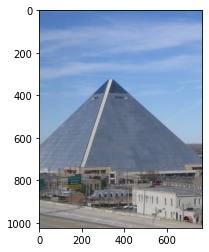

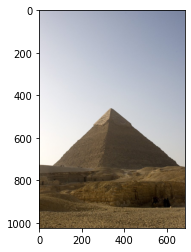

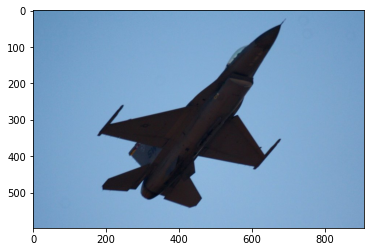

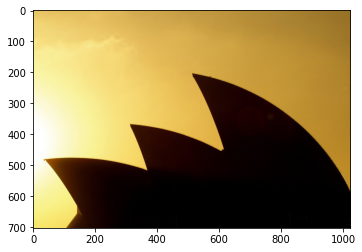

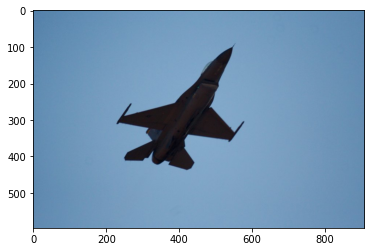

In [10]:
%pylab inline
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

for i in range(5):
  img = mpimg.imread("/content/drive/My Drive/IR/Flickr15K/images/"+ranking[i][0]+".jpg")
  imgplot = plt.imshow(img)
  plt.show()

generating ranking for every query

In [ ]:
result={}
count=0
for filename in feature_sketch:
  count+=1
  result[filename]=findRanking(feature_real,feature_sketch[filename])
  if count%10==0:
    print(filename," ",count)

###Storing ground truth on single dict


In [ ]:
sketch_ground_truth = {}
for i in range(1, 34):
  sketch_ground_truth[i] = []
file = open("/content/drive/My Drive/IR/Flickr15K/list_images.txt", "r")
title_list = []
for line in file.readlines():
    line = line.strip('\n').split(" ")
    number = int(line[0])
    name = line[1].split("/")[0]
    if name not in sketch_ground_truth[number]:
      sketch_ground_truth[number].append(name)
file.close()

In [ ]:
sketch_ground_truth[20]

['heart_shape']

Loading Ranking which was dumped before

In [6]:
import pickle
file=open('/content/drive/My Drive/IR/Result/RankingResNet50.pkl','rb')
ranking_vgg=pickle.load(file)
file.close()


In [ ]:
ranking_vgg['1/20']

##Rocchio method:

In [ ]:
import numpy as np
def Rocchio_method(features,Q,relevent,B,G):
  Q=Q[0]
  Dre=[]
  Dnr=[]
  
  n=0
  m=0
  for filename in features:
    name=filename.split('/')[0]
    if name in relevent:
      Dre.append(features[filename][0])
      n+=1
    else:
      m+=1
      Dnr.append(features[filename][0])

  Dre=np.array(Dre)
  Dnr=np.array(Dnr)
  Q1=[]

  
  tmp=Q
  sum=0*Q
  sum=np.array(sum)
  for j in range(n):
    sum+=Dre[j]
  tmp+=(B/n)*sum

  sum1=0*Q
  sum1=np.array(sum1)
  for j in range(m):
    sum1+=Dnr[j]
  tmp-=(G/m)*sum1

  Q1= np.where(tmp<0, 0, tmp)

    
  Q1=[Q1]

  Q1=np.array(Q1)
  return Q1
  


In [ ]:
sketch_ground_truth[20]

['heart_shape']

Testing on single quey

In [ ]:
filename='1/17'
no_iter=7
flag=True
for i in range(no_iter):
  if flag:
    res=Rocchio_method(feature_real,feature_sketch[filename],sketch_ground_truth[int(filename.split('/')[1])],0.75,0.25)
    flag=False
  else:
    res=Rocchio_method(feature_real,res,sketch_ground_truth[int(filename.split('/')[1])],0.75,0.25)

In [ ]:
np.shape(res)

(1, 131072)

In [ ]:
np.shape(res)

(1, 131072)

In [ ]:
ranking=findRanking_euclidean_distances(feature_real,res)

Populating the interactive namespace from numpy and matplotlib


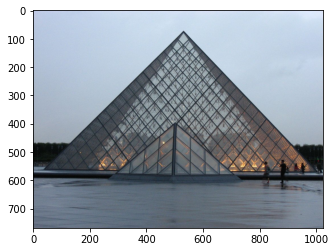

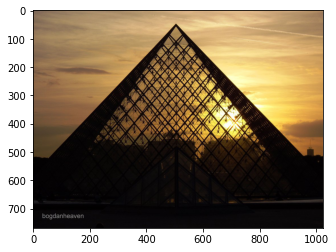

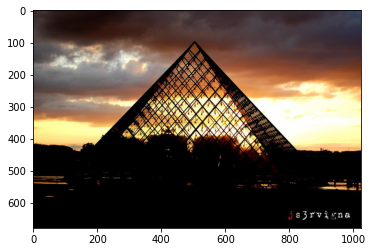

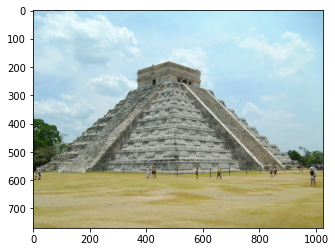

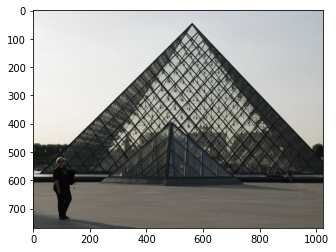

In [13]:
%pylab inline
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

for i in range(5):
  img = mpimg.imread("/content/drive/My Drive/IR/Flickr15K/images/"+ranking[i][0]+".jpg")
  imgplot = plt.imshow(img)
  plt.show()

In [ ]:
new_feature_sketch={}
count=0
for filename in feature_sketch:
  count+=1
  if count%10==0:
    print(filename," ",count)
  no_iter=3
  flag=True
  for i in range(no_iter):
    if flag:
      res=Rocchio_method(feature_real,feature_sketch[filename],sketch_ground_truth[int(filename.split('/')[1])],0.75,0.25)
      flag=False
    else:
      res=Rocchio_method(feature_real,res,sketch_ground_truth[int(filename.split('/')[1])],0.75,0.25)
  new_feature_sketch[filename]=res

In [ ]:
from pickle import dump
dump(new_feature_sketch, open('/content/drive/MyDrive/IR/new_sketch_features/newSketchFeatures_ResNet_3.pkl', 'wb'))

In [ ]:
import pickle
file=open('/content/drive/MyDrive/IR/new_sketch_features/newSketchFeatures_ResNet_7.pkl','rb')
new_feature_sketch=pickle.load(file)
file.close()

In [ ]:
result={}
count=0
for filename in new_feature_sketch:
  count+=1
  result[filename]=findRanking(feature_real,new_feature_sketch[filename])
  if count%10==0:
    print(filename," ",count)

In [ ]:
from pickle import dump
dump(result, open('/content/drive/MyDrive/IR/new_Ranking/newSketchRanking_ResNet_3.pkl', 'wb'))

In [11]:
import pickle
file=open('/content/drive/MyDrive/IR/new_Ranking/newSketchRanking_euclidean_distances_ResNet_7.pkl','rb')
ranking_resnet=pickle.load(file)
file.close()

In [ ]:
def find_precision(actual,ranking,top):
  precision=0
  for i in range(top):
    arr=ranking[i][0].split('/')
    if arr[0] in actual:
      precision+=1
  
  return precision/top

In [ ]:
pre=find_precision(sketch_ground_truth[24],ranking_vgg['1/24'],1000)
pre

0.398

total relevent images:

In [ ]:
sketch_relevent = {}
for i in range(1, 34):
  sketch_relevent[i] = 0
file = open("/content/drive/My Drive/IR/Flickr15K/list_images.txt", "r")
title_list = []
for line in file.readlines():
    line = line.strip('\n').split(" ")
    number = int(line[0])
    name = line[1].split("/")[0]
    sketch_relevent[number]+=1
file.close()

In [ ]:
sketch_relevent[1]

1306

In [ ]:
sketch_ground_truth = {}
for i in range(1, 34):
  sketch_ground_truth[i] = []
file = open("/content/drive/My Drive/IR/Flickr15K/list_images.txt", "r")
title_list = []
for line in file.readlines():
    line = line.strip('\n').split(" ")
    number = int(line[0])
    name = line[1].split(".")[0]
    if name not in sketch_ground_truth[number]:
      sketch_ground_truth[number].append(name)
file.close()

In [ ]:
len(sketch_ground_truth[1])

1306

In [ ]:
def compute_MAP(actual,ranking):
  precision=[]
  recall=[]
  count=0;
  n=len(actual)
  for i in range(len(ranking)):
    
    arr=ranking[i][0].split('.')
    
    if arr[0] in actual:
      count+=1
      recall.append(count/n)
      precision.append(count/(i+1))
      # recall[count/n]=count/(i+1)
      # print(count,i)
    
  return (recall,precision)

In [ ]:
def AP(recall,precision):
  n=len(recall)
  j=0;
  p={}
  ap=0
  for i in range(10):
    for k in range(n):
      if(((i+1)*10)>(recall[k]*100)):
        continue
      else:
        # print(recall[k]*100)
        p[(i+1)*10]=precision[k]*100
        ap+=(precision[k]*100)
        break
  ap/=10
  return ap

In [ ]:
map=0
for filename,value in ranking_resnet.items():
  index=filename.split('/')
  # print(filename)
  recall,precision=compute_MAP(sketch_ground_truth[int(index[1])],value)
  map+=AP(recall,precision)
  # print(recall)
  # break
  # c+=1
map/=len(ranking_resnet)
print("MAP = "+str(map))

MAP = 58.65758225737865
